Filtro espaciais Max,Min,Mediana e Moda

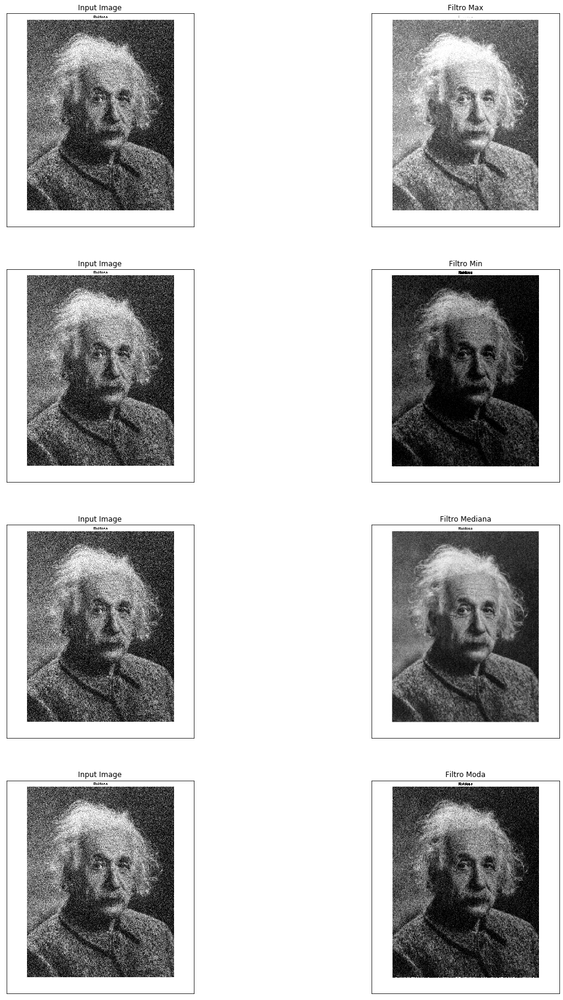

In [37]:
import numpy as np
import cv2
from scipy.stats import mode
from matplotlib import pyplot as plt

img = cv2.imread('ruido.jpg',0)                                            # lendo imagem em tons de cinza


def median_filter(image,n):
    output = np.zeros_like(image)                                          #cria matriz de zeros do tamanho da imagem
    output = np.dstack((output,output,output,output))                      #adiciona outra dimensao para armazenar todas as saidas em uma matriz
    padded_x = image.shape[0] + (n- 1)                                     #tamanho da imagem somado com n
    padded_y = image.shape[1] + (n - 1)                                    #tamanho da imagem somado com n
    image_padded = np.zeros((padded_x,padded_y))                           #"imagem aumentada" recebe zeros com tamanho da imagem + mascara
    w_x = int((n - 1)/2)                                                   #valor inteiro do tamanho da mascara/2
    w_y = int((n - 1)/2)                                                   #valor inteiro do tamanho da mascara/2
    image_padded[w_x:-w_x, w_y:-w_y] = image                               #recebe a imagem, deixando de fora o tamanho adicionado
    for x in range(image.shape[0]):                                        #percorre as posicoes x da matriz
        for y in range(image.shape[1]):                                    #percorre as posicoes y da matriz
            y_end = y+n                                                    #posicao y + tamanho da mascara
            x_end = x+n                                                    #posicao x + tamanho da mascara
            output[x,y,0]=np.max(image_padded[x:x_end,y:y_end])            #filtro max recebe tamanho maximo dentre os limites da mascara
            output[x,y,1]=np.min(image_padded[x:x_end,y:y_end])            #filtro min recebe tamanho minimo dentre os limites da mascara
            output[x,y,2]=np.mean(image_padded[x:x_end,y:y_end])           #filtro media recebe valor medio dentre os limites da mascara
            output[x,y,3]=mode(image_padded[x:x_end,y:y_end])[0][0][0]     #filtro moda recebe valor moda dentre os limites da masca
    return output


gray_image = median_filter(img,3)                                          # chama a funcao


## plotagem dos sinais


plt.figure(figsize=(20,30))
plt.subplot(421),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(422),plt.imshow(gray_image[:,:,0], cmap = 'gray')
plt.title('Filtro Max'), plt.xticks([]), plt.yticks([])
plt.subplot(423),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(424),plt.imshow(gray_image[:,:,1], cmap = 'gray')
plt.title('Filtro Min'), plt.xticks([]), plt.yticks([])
plt.subplot(425),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(426),plt.imshow(gray_image[:,:,2], cmap = 'gray')
plt.title('Filtro Mediana'), plt.xticks([]), plt.yticks([])
plt.subplot(427),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(428),plt.imshow(gray_image[:,:,3], cmap = 'gray')
plt.title('Filtro Moda'), plt.xticks([]), plt.yticks([])
plt.show()

Filtros Espaciais Media e Gaussiano

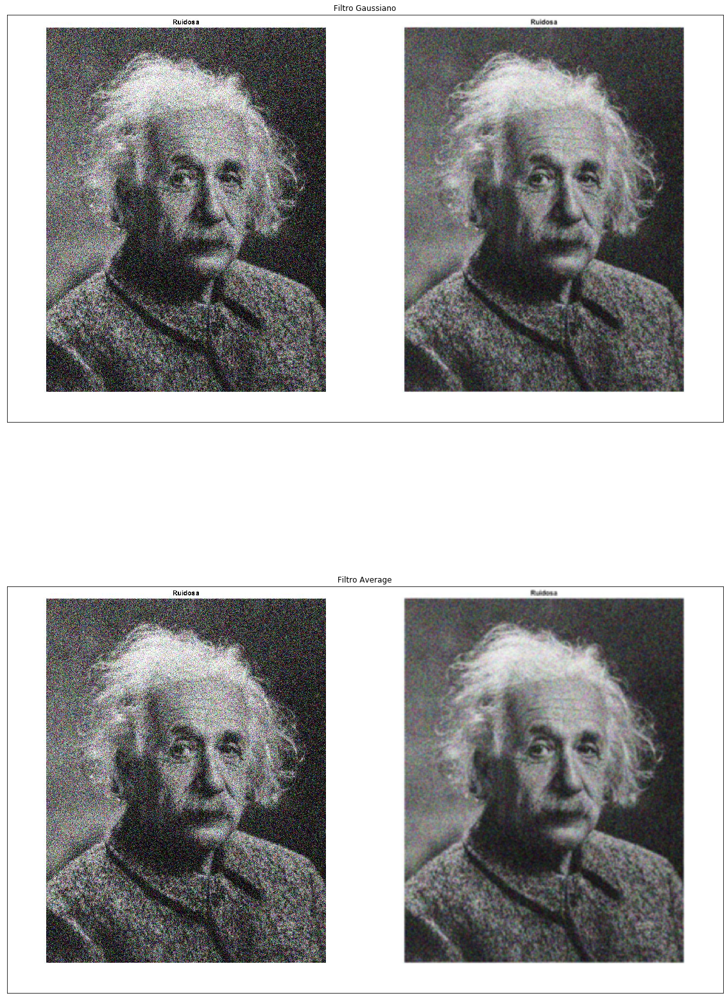

In [38]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('ruido.jpg')                                #lendo imagem
gaussian = cv2.GaussianBlur(img,(5,5),0)                     #aplicando filtro gaussiano
average = cv2.blur(img,(5,5))                                #aplicando filtro media



##plotagem do sinais


plt.figure(figsize=(20,30))
plt.subplot(2,1,1)
plt.imshow(np.hstack((img, gaussian)), cmap = 'gray')
plt.title('Filtro Gaussiano'), plt.xticks([]), plt.yticks([])
plt.subplot(2,1,2)
plt.imshow(np.hstack((img, average)), cmap = 'gray')
plt.title('Filtro Average'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
Filtros Espaciais

Filtros detectores de bordas 

Laplaciano, Roberts e Sobel

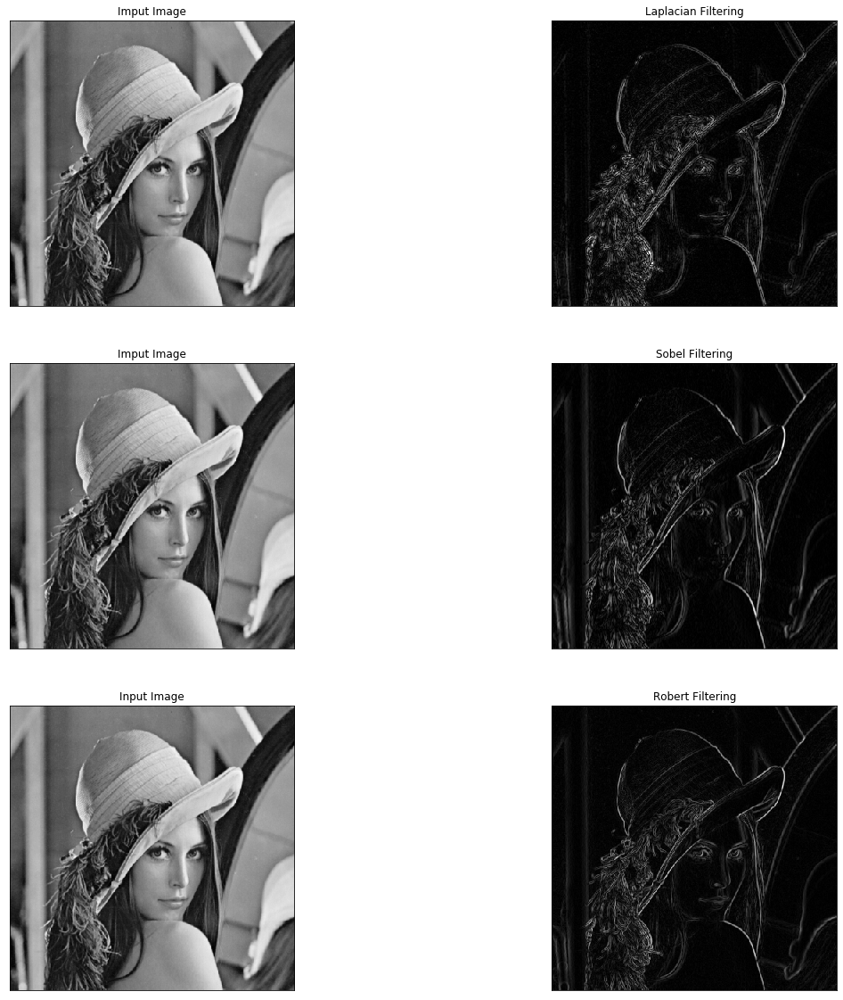

In [35]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.ndimage import convolve

img = cv2.imread('Lena.pgm',0)

roberts_cross_v = np.array( [[ 1, 0 ],[ 0,-1 ]] )       #kernel vertical para filtragem de Roberts

roberts_cross_h = np.array( [[ 0, 1 ],[ -1, 0 ]] )      #kernel horizontal para filtragem de Roberts

def roberts_cross(imagem) :
    image = np.asarray(imagem,dtype="int32")                               #transforma a imagem em numpy
    vertical = convolve( image, roberts_cross_v )                          #aplica a convolucao do kernel horizontal
    horizontal = convolve( image, roberts_cross_h )                        #aplica convolução do kernel vertical
    output_image = np.sqrt( np.square(horizontal) + np.square(vertical))   #coleta os valores do filtor de Roberts
    return output_image                                                    #retorna  a imagem filtrada


#Roberts
Roberts = roberts_cross(img) 

#laplaciano
Laplace = cv2.Laplacian(img,cv2.CV_64F,ksize=5)

#Sobel
Sobel = cv2.Sobel(img,cv2.CV_64F,1,0)                                            


## plotagem dos sinais
plt.figure(figsize=(20,20))
plt.subplot(3,2,1)
plt.imshow(img, cmap = 'gray')
plt.title('Imput Image'), plt.xticks([]), plt.yticks([])

plt.subplot(3,2,2)
plt.imshow(abs(Laplace), cmap = 'gray')
plt.title('Laplacian Filtering'), plt.xticks([]), plt.yticks([])


plt.subplot(3,2,3)
plt.imshow(img, cmap = 'gray')
plt.title('Imput Image'), plt.xticks([]), plt.yticks([])

plt.subplot(3,2,4)
plt.imshow(abs(Sobel), cmap = 'gray')
plt.title('Sobel Filtering'), plt.xticks([]), plt.yticks([])

plt.subplot(3,2,5)
plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])

plt.subplot(3,2,6)
plt.imshow( abs(Roberts), cmap = 'gray')
plt.title('Robert Filtering'), plt.xticks([]), plt.yticks([])


plt.show()


Filtros na Frequencia

Passa Alta e Passa Baixa

Filtro Ideal,Butterworth e Gaussiano


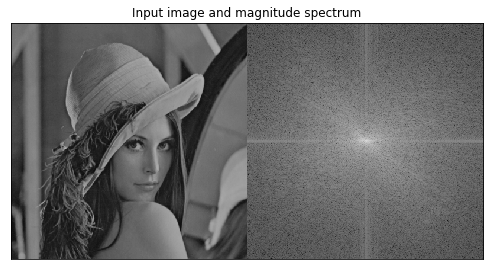

/home/joao/.local/share/virtualenvs/PDI-KW-fhQfR/lib/python3.6/site-packages/ipykernel_launcher.py:57: RuntimeWarning: divide by zero encountered in true_divide
/home/joao/.local/share/virtualenvs/PDI-KW-fhQfR/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: divide by zero encountered in true_divide


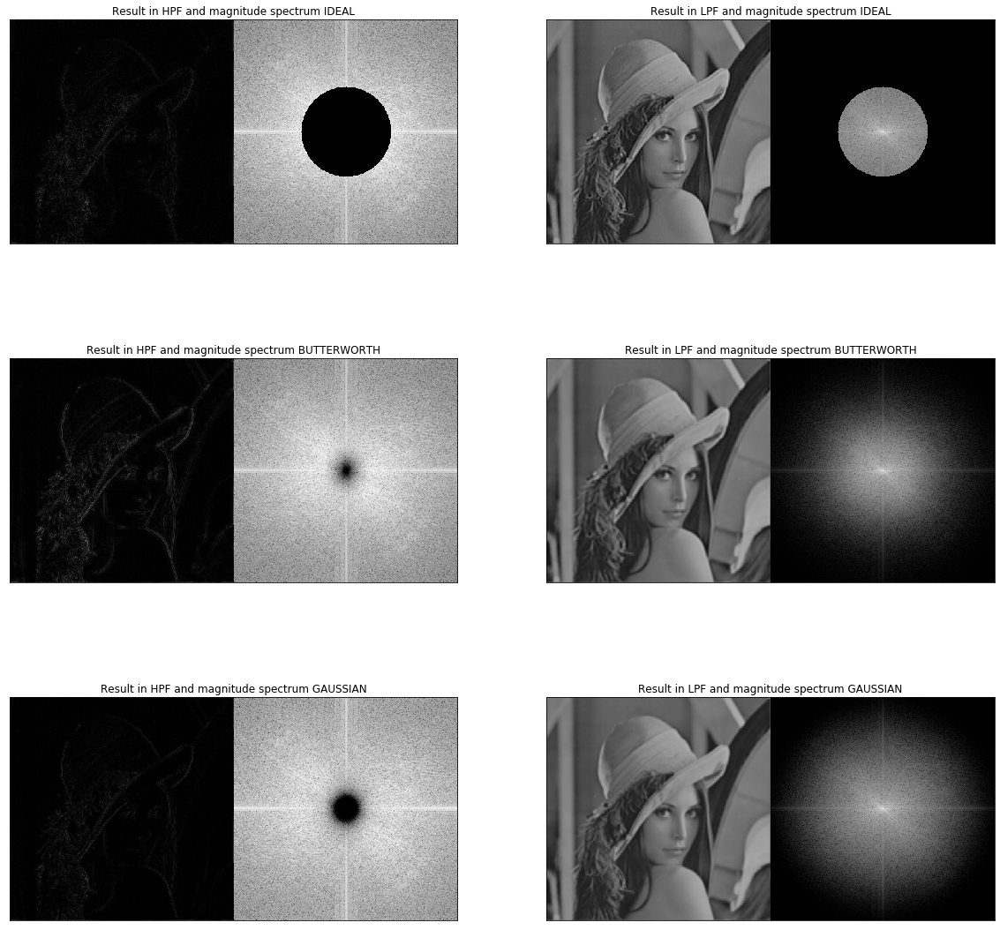

In [3]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
##lendo a imagem
img = cv2.imread('Lena.pgm',0)
f = np.fft.fft2(img)                               #armazenando a fft da imagem
fshift = np.fft.fftshift(f)                        #centralizando a fft da imagem
magnitude_spectrum = 20*np.log(1+np.abs(fshift))   #utilizando a escala decibeis

#plotando a imagem e sua magnitude
plt.figure(figsize=(20,20))
plt.subplot(4,1,1)
plt.imshow(np.hstack((img, magnitude_spectrum)), cmap = 'gray')
plt.title('Input image and magnitude spectrum'), plt.xticks([]), plt.yticks([])
plt.show()



#######INICIO DA FILTRAGEM IDEAL#####################################################################################
rows, cols = img.shape                                   #armazena o tamanho da imagem nas variaveis rows e cols
crow,ccol = int(rows/2) , int(cols/2)                    #armazena a posicao de centro da imagem nas variaveis crow e ccol
IDEAL = np.ones_like(fshift)                             #cria uma matriz de "ums" de mesmo tamanho da imagem

#criando funcao ideal

r = 80                                                   #raio de operacao do filtro ideal
center = [crow, ccol]                                    #armazena os valores de centro em um vetor
x, y = np.ogrid[:rows, :cols]                            #cria vetores x e y com tamanho da imagem
##funcao ideal de um filtro passa baixa
mask_area = (x-np.array(center)[0]) ** 2 + (y-np.array(center)[1]) ** 2 <= r*r
IDEAL[mask_area]=0                                      #atribuindo valor 0 a posicoes menores que as observadas pela funcao acima
fshiftH=fshift*IDEAL                                    #filtro PASSA FAIXA
fshiftL=fshift*(1-IDEAL)                                #filtro REJEITA FAIXA
magnitude_spectrumH = 20*np.log(1+np.abs(fshiftH))   #aplicando escala decibeis
magnitude_spectrumL = 20*np.log(1+np.abs(fshiftL))   #aplicando escala decibeis
## recuperando a imagem filtrada de forma ideal
f_ishiftH = np.fft.ifftshift(fshiftH)                   #desfaz o fftshift
img_backH = np.fft.ifft2(f_ishiftH)                     #faz a operacao inversa de fft
img_backH = np.abs(img_backH)                           #coleta os valores absolutos do ifft

f_ishiftL = np.fft.ifftshift(fshiftL)                   #desfaz o fftshift
img_backL = np.fft.ifft2(f_ishiftL)                     #faz a operacao inversa de fft
img_backL = np.abs(img_backL)                           #coleta os valores absolutos do ifft


#######INICIO DA FILTRAGEM IDEAL#####################################################################################
#####################################################################################################################
######INICIO DA FILTRAGEM BUTTERWORTH ###############################################################################


D0=50                                                  #raio de operacao d filtro gaussiano
n=3                                                    #ordem do filtro

# posição dos pixels em forma circular
D = np.sqrt((x-np.array(center)[0]) ** 2 + (y-np.array(center)[1]) ** 2) 

ButH = (1+ (np.sqrt(2)-1)*((D0/D)**(2*n)))**-1         #funcao BUTTERWORTH passa alta
ButL = (1+ (np.sqrt(2)-1)*((D/D0)**(2*n)))**-1         #funcao  BUTTERWORTH passa baixa
fshiftBH=fshift*ButH                                   #aplicando filtro BUTTERWORTH ao sinal
fshiftBL=fshift*ButL                                   #aplicando filtro BUTTERWORTH ao sinal
magnitude_spectrumBH = 20*np.log(1+np.abs(fshiftBH))   #aplicando escala decibeis
magnitude_spectrumBL = 20*np.log(1+np.abs(fshiftBL))   #aplicando escala decibeis

## recuperando o sinal 
f_ishiftBH = np.fft.ifftshift(fshiftBH)               #desfaz o fftshift
img_backBH = np.fft.ifft2(f_ishiftBH)                 #aplica o inverso da operacao fft
img_backBH = np.abs(img_backBH)                       #obtem os valores absolutos

f_ishiftBL = np.fft.ifftshift(fshiftBL)               #desfaz o fftshift
img_backBL = np.fft.ifft2(f_ishiftBL)                 #aplica o inverso da operacao fft
img_backBL = np.abs(img_backBL)                       #obtem os valores absolutos



#######FIM DA FILTRAGEM BUTTERWORTH#####################################################################################
#####################################################################################################################
######INICIO DA FILTRAGEM GAUSSIANA ###############################################################################


#Gaussian Filter
 
sigma=70                                              #raiz quadrada da variancia
GasH = np.e**((sigma**2)/(-D**2 ))                    #funcao gaussiana passa alta
GasL = np.e**((-D**2 )/(sigma**2))                    #funcao gaussiana passa baixa
fshiftGH=fshift*GasH                                  #aplicando filtro ao sinal
fshiftGL=fshift*GasL                                  #aplicando filtro ao sinal
magnitude_spectrumGH = 20*np.log(1+np.abs(fshiftGH))  #obtendo valor em decibel
magnitude_spectrumGL = 20*np.log(1+np.abs(fshiftGL))  #obtendo valor em decibel


## recuperando o sinal
f_ishiftGH = np.fft.ifftshift(fshiftGH)               #defaz o fftshift
img_backGH = np.fft.ifft2(f_ishiftGH)                 #aplica a inversa da fft no sinal
img_backGH = np.abs(img_backGH)                       #coleta os valores absolutos

f_ishiftGL = np.fft.ifftshift(fshiftGL)               #defaz o fftshift
img_backGL = np.fft.ifft2(f_ishiftGL)                 #aplica a inversa da fft no sinal
img_backGL = np.abs(img_backGL)                       #coleta os valores absolutos


#######FIM DA FILTRAGEM GAUSSIANA###################################################################################


## plotagem do sinal

plt.figure(figsize=(20,20))
plt.subplot(3,2,1),plt.imshow(np.hstack((img_backH, magnitude_spectrumH)), cmap = 'gray')
plt.title('Result in HPF and magnitude spectrum IDEAL'),plt.xticks([]), plt.yticks([])
plt.subplot(3,2,2),plt.imshow(np.hstack((img_backL, magnitude_spectrumL)), cmap = 'gray')
plt.title('Result in LPF and magnitude spectrum IDEAL'),plt.xticks([]), plt.yticks([])
plt.subplot(3,2,3),plt.imshow(np.hstack((img_backBH, magnitude_spectrumBH)), cmap = 'gray')
plt.title('Result in HPF and magnitude spectrum BUTTERWORTH'),plt.xticks([]), plt.yticks([])
plt.subplot(3,2,4),plt.imshow(np.hstack((img_backBL, magnitude_spectrumBL)), cmap = 'gray')
plt.title('Result in LPF and magnitude spectrum BUTTERWORTH'),plt.xticks([]), plt.yticks([])
plt.subplot(3,2,6),plt.imshow(np.hstack((img_backGL, magnitude_spectrumGL)), cmap = 'gray')
plt.title('Result in LPF and magnitude spectrum GAUSSIAN'),plt.xticks([]), plt.yticks([])
plt.subplot(3,2,5),plt.imshow(np.hstack((img_backGH, magnitude_spectrumGH)), cmap = 'gray')
plt.title('Result in HPF and magnitude spectrum GAUSSIAN'),plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
Passa faixa


butterworth e gaussiano


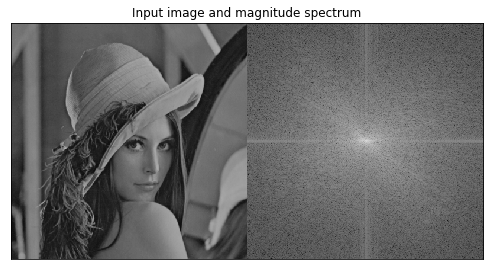

/home/joao/.local/share/virtualenvs/PDI-KW-fhQfR/lib/python3.6/site-packages/ipykernel_launcher.py:67: RuntimeWarning: divide by zero encountered in true_divide
/home/joao/.local/share/virtualenvs/PDI-KW-fhQfR/lib/python3.6/site-packages/ipykernel_launcher.py:93: RuntimeWarning: divide by zero encountered in true_divide


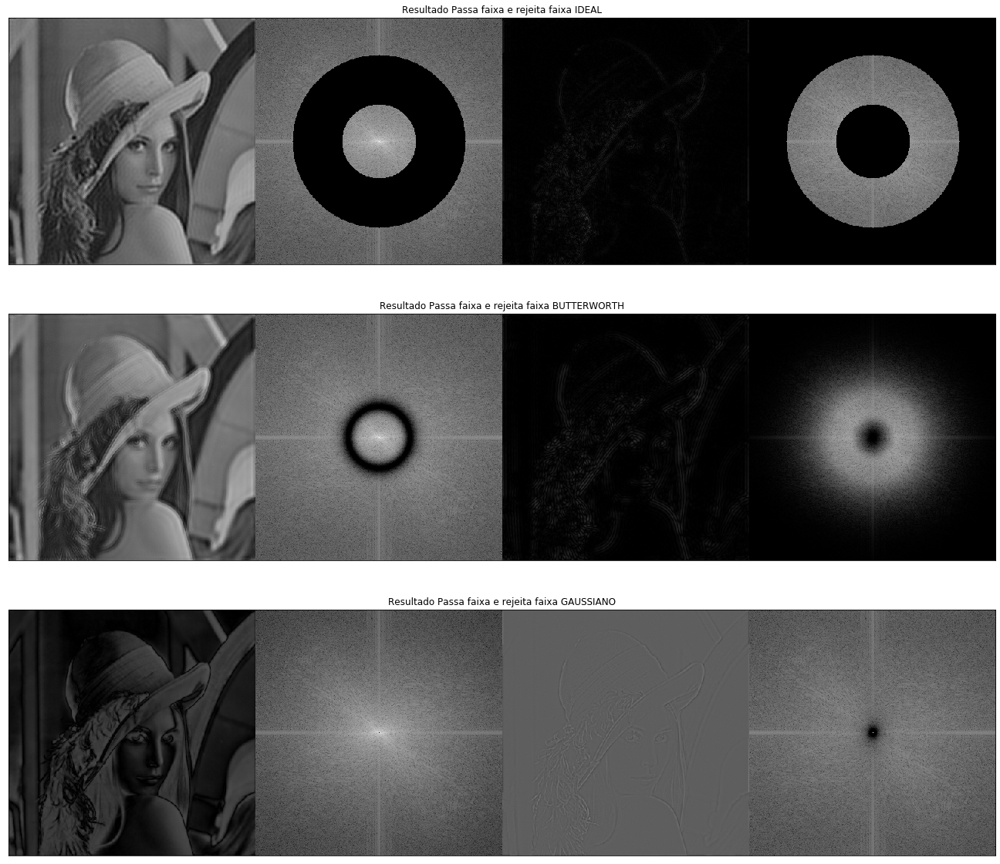

In [31]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

##obtendo imagem e seu espectro

img = cv2.imread('Lena.pgm',0)                                                   #lendo imagem
f = np.fft.fft2(img)                                                             #calculando fft
fshift = np.fft.fftshift(f)                                                      #centralizando fft
magnitude_spectrum = 20*np.log(1+np.abs(fshift))                                 #mostrando o sinal em dB

## plotando o sinal
plt.figure(figsize=(20,20))
plt.subplot(4,1,1)
plt.imshow(np.hstack((img, magnitude_spectrum)), cmap = 'gray')
plt.title('Input image and magnitude spectrum'), plt.xticks([]), plt.yticks([])
plt.show()



########INICIO DA FILTRAGEM IDEAL#####################################################################################
## criando filtro passa faixa ideal

rows, cols = img.shape                             #atribui o tamanho da imagem as variaveis rows e cols
crow,ccol = int(rows/2) , int(cols/2)              #atribui o centro da imagem as variaveis crow e ccol
center = [crow, ccol]                              
x, y = np.ogrid[:rows, :cols]                      #cria dois vetores x e y com tamanho rows e cols
deixa = np.zeros_like(fshift)                      #cria matriz de "zeros"
rejeita = np.ones_like(fshift)
fc = 100                                           #frequencia de corte
W = 80                                             #largura de banda

## funcao do filtro passa faixa

mask_area = np.logical_and((x-np.array(center)[0]) ** 2 + (y-np.array(center)[1]) ** 2 >= (fc-W/2)**2,(x-np.array(center)[0]) ** 2 + (y-np.array(center)[1]) ** 2 <= (fc+W/2)**2)
deixa[mask_area]=1                                 #aplicando funcao passa faixa na matriz de "zeros"
rejeita[mask_area]=0                               #aplicando funcao rejeita faixa na matriz de "ums"
passaIdeal = fshift*deixa                          #aplicando filtro passa faixa
rejeitaIdeal = fshift*rejeita                      #aplicando filtro rejeita faixa
magRejeita = 20*np.log(1+np.abs(rejeitaIdeal))     #atribui valores em dB
magPassa = 20*np.log(1+np.abs(passaIdeal))         #atribui valores em dB

## recuperando sinal filtrado PASSA FAIXA

f_ishiftBP = np.fft.ifftshift(passaIdeal)          #descentralizando sinal na frequencia
img_backBP = np.fft.ifft2(f_ishiftBP)              #aplicando a fft inversa
img_backBP = np.abs(img_backBP)                    #recebendo valores absolutos da operação ifft

## recuperando sinal filtrado REJEITA FAIXA


f_ishiftBR = np.fft.ifftshift(rejeitaIdeal)        #descentralizando sinal na frequencia
img_backBR = np.fft.ifft2(f_ishiftBR)              #aplicando a fft inversa
img_backBR = np.abs(img_backBR)                    #recebendo valores absolutos da operação ifft


####  fim da filtragem IDEAL  ##################################################################################
################################################################################################################
####  inicio filtragem BUTTERWORTH  ############################################################################



# posição dos pixels em forma circular
D = np.sqrt((x-np.array(center)[0])**2 + (y-np.array(center)[1])**2)

D0 = 50                                                 # parametro para fc
W=40                                                    # parametro para largura de banda
n=3                                                     # grau de convergencia do filtro
Butterworth = (1+(D*W/(D**2-D0**2))**(2*n))**-1         # funcao butterworth passa faixa
passaButt = fshift*Butterworth                          # filtro PASSA butterworth
rejeitaButt = fshift*(1-Butterworth)                    # filtro REJEITA butterworth
magPassaButt = 20*np.log(1+np.abs(passaButt))           #atribui valores em dB
magRejeitaButt = 20*np.log(1+np.abs(rejeitaButt))       #atribui valores em dB
## recuperando sinal filtrado ÁSSA FAIXA

f_ishiftBPButt = np.fft.ifftshift(passaButt)               #descentralizando sinal na frequencia
img_backBPButt = np.fft.ifft2(f_ishiftBPButt)              #aplicando a fft inversa
img_backBPButt = np.abs(img_backBPButt)                    #recebendo valores absolutos da operação ifft

## recuperando sinal filtrado REJEITA FAIXA

f_ishiftBRButt = np.fft.ifftshift(rejeitaButt)             #descentralizando sinal na frequencia
img_backBRButt = np.fft.ifft2(f_ishiftBRButt)              #aplicando a fft inversa
img_backBRButt = np.abs(img_backBRButt)                    #recebendo valores absolutos da operação ifft

####  fim da filtragem BUTTERWORTH  ##################################################################################
################################################################################################################
####  inicio filtragem GAUSSIANA  ############################################################################

# criando filtro GAUSSIANO
#R=30
D0 =0.5                                                 # sigma
W = 80                                                # banda

gauss = 1 - np.e**((-(D**2-D0**2)/(D*W))**-1)             # funcao gaussiana

passaGaus = fshift*gauss                              # filtro PASSA butterworth
rejeitaGaus = fshift*(1-gauss)                        # filtro REJEITA butterworth
magPassaGaus = 20*np.log(1+np.abs(passaGaus))         #atribui valores em dB
magRejeitaGaus = 20*np.log(1+np.abs(rejeitaGaus))     #atribui valores em dB

## recuperando sinal filtrado PASSA FAIXA

f_ishiftBPGaus = np.fft.ifftshift(passaGaus)               #descentralizando sinal na frequencia
img_backBPGaus = np.fft.ifft2(f_ishiftBPGaus)              #aplicando a fft inversa
img_backBPGaus = np.abs(img_backBPGaus)                    #recebendo valores absolutos da operação ifft

## recuperando sinal filtrado REJEITA FAIXA

f_ishiftBRGaus = np.fft.ifftshift(rejeitaGaus)             #descentralizando sinal na frequencia
img_backBRGaus = np.fft.ifft2(f_ishiftBRGaus)              #aplicando a fft inversa
img_backBRGaus = np.abs(img_backBRGaus)                    #recebendo valores absolutos da operação ifft

####  fim da filtragem GAUSSIANA  ##################################################################################
################################################################################################################




#plotagem dos sinais

plt.figure(figsize=(30,20))
plt.subplot(3,1,1),plt.imshow(np.hstack((img_backBR, abs(magRejeita),img_backBP, abs(magPassa))), cmap = 'gray')
plt.title('Resultado Passa faixa e rejeita faixa IDEAL'),plt.xticks([]), plt.yticks([])

plt.subplot(3,1,2),plt.imshow(np.hstack((img_backBPButt, abs(magPassaButt),img_backBRButt, abs(magRejeitaButt))), cmap = 'gray')
plt.title('Resultado Passa faixa e rejeita faixa BUTTERWORTH'),plt.xticks([]), plt.yticks([])

plt.subplot(3,1,3),plt.imshow(np.hstack((img_backBPGaus, abs(magPassaGaus),img_backBRGaus, abs(magRejeitaGaus))), cmap = 'gray')
plt.title('Resultado Passa faixa e rejeita faixa GAUSSIANO'),plt.xticks([]), plt.yticks([])


plt.show()